In [1]:
import os
import xml.etree.ElementTree as ET
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import models, layers, optimizers, regularizers
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Funkcja do parsowania plików XML
def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    filename = root.find('filename').text
    size = root.find('size')
    width = int(size.find('width').text)
    height = int(size.find('height').text)
    boxes = []
    for obj in root.findall('object'):
        name = obj.find('name').text
        if name in ['licence', 'LP']:
            xmin = int(obj.find('bndbox').find('xmin').text)
            ymin = int(obj.find('bndbox').find('ymin').text)
            xmax = int(obj.find('bndbox').find('xmax').text)
            ymax = int(obj.find('bndbox').find('ymax').text)
            boxes.append((xmin, ymin, xmax, ymax))
    return filename, width, height, boxes

# Funkcja do ładowania danych
def load_data(directory):
    images = []
    labels = []
    for filename in os.listdir(directory):
        if filename.endswith((".png", ".jpg")):
            image_path = os.path.join(directory, filename)
            xml_path = os.path.join(directory, filename[:-4] + ".xml")
            if os.path.exists(xml_path):
                _, width, height, boxes = parse_xml(xml_path)
                if len(boxes) == 1:
                    images.append(image_path)
                    labels.append(boxes)
    return images, labels

def load_data_check(directory):
    images = []
    for filename in os.listdir(directory):
        if filename.endswith(".png"):
            image_path = os.path.join(directory, filename)
            images.append(image_path)
    return images

# Funkcja do normalizacji danych
def normalize_data(images, labels):
    normalized_labels = []
    data_array = []
    for i in range(len(labels)):
        img = Image.open(images[i]).convert('RGB').resize((256, 256), Image.LANCZOS)  # zmiana na 256x256
        img_array = np.array(img)
        data_array.append(img_array)
        [(xmin, ymin, xmax, ymax)] = labels[i]
        original_img = Image.open(images[i])
        w, h = original_img.size
        h_scale = h / 256
        w_scale = w / 256
        nxmin, nxmax = int(xmin / w_scale), int(xmax / w_scale)
        nymin, nymax = int(ymin / h_scale), int(ymax / h_scale)
        normalized_labels.append([nxmin, nymin, nxmax, nymax])
    data_array = np.array(data_array).astype('float32') / 255.0
    normalized_labels = np.array(normalized_labels)
    return data_array, normalized_labels

# Funkcja do definiowania modelu
def create_model():
    model_iou = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),

        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),

        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),

        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),

        layers.Flatten(),
        layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
        layers.Dropout(0.5),
        layers.Dense(4)  # Output layer for bounding box coordinates (xmin, ymin, xmax, ymax)
    ])
    
    model_iou.compile(optimizer=optimizers.Adam(learning_rate=1e-4), loss='mse', metrics=[iou_metric])
    return model_iou

# Funkcja do obliczania metryki IoU
def iou_metric(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    x1_true, y1_true, x2_true, y2_true = tf.split(y_true, 4, axis=-1)
    x1_pred, y1_pred, x2_pred, y2_pred = tf.split(y_pred, 4, axis=-1)
    x1_inter = tf.maximum(x1_true, x1_pred)
    y1_inter = tf.maximum(y1_true, y1_pred)
    x2_inter = tf.minimum(x2_true, x2_pred)
    y2_inter = tf.minimum(y2_true, y2_pred)
    inter_area = tf.maximum(0.0, x2_inter - x1_inter) * tf.maximum(0.0, y2_inter - y1_inter)
    true_area = (x2_true - x1_true) * (y2_true - y1_true)
    pred_area = (x2_pred - x1_pred) * (y2_pred - y1_pred)
    union_area = true_area + pred_area - inter_area
    iou = inter_area / (union_area + tf.keras.backend.epsilon())
    return tf.reduce_mean(iou)

# Załaduj dane
data_dir = "/Users/kuba/ML_project/project/train_data" # Podaj ścieżkę do danych
data_images, data_labels = load_data(data_dir)
data_array, normalized_labels = normalize_data(data_images, data_labels)
data_train, data_val, labels_train, labels_val = train_test_split(data_array, normalized_labels, train_size=0.8, random_state=0)

In [2]:
# Utwórz model
model = create_model()

# Trenowanie modelu
model.fit(data_train, labels_train, epochs=50, validation_data=(data_val, labels_val), batch_size=32)

/opt/miniconda3/envs/tf_env/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(
2024-06-06 17:39:08.713985: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1
2024-06-06 17:39:08.714028: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-06-06 17:39:08.714045: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-06-06 17:39:08.714074: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-06-06 17:39:08.714108: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/rep

Epoch 1/50


2024-06-06 17:39:10.198731: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


29/29 ━━━━━━━━━━━━━━━━━━━━ 22s 611ms/step - iou_metric: 0.0143 - loss: 11497.5879 - val_iou_metric: 0.0000e+00 - val_loss: 22972.9941
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 16s 551ms/step - iou_metric: 0.0680 - loss: 1436.1230 - val_iou_metric: 0.0000e+00 - val_loss: 21611.6270
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 16s 549ms/step - iou_metric: 0.0947 - loss: 1059.3447 - val_iou_metric: 0.0000e+00 - val_loss: 19443.1992
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 16s 548ms/step - iou_metric: 0.1255 - loss: 877.3590 - val_iou_metric: 0.0000e+00 - val_loss: 15608.2070
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 16s 547ms/step - iou_metric: 0.1526 - loss: 721.0798 - val_iou_metric: 3.2824e-06 - val_loss: 12613.8340
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 16s 552ms/step - iou_metric: 0.1465 - loss: 683.1167 - val_iou_metric: 1.1009e-04 - val_loss: 9278.2451
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 16s 556ms/step - iou_metric: 0.1756 - loss: 575.9559 - val_iou_metric: 2.5137e-04 - val_loss: 8502.8799
Epoch 8/

In [5]:
import numpy as np
from PIL import Image

# Funkcja do normalizacji danych
def normalize_images_check(images):
    data_array = []
    for img_path in images:
        img = Image.open(img_path).convert('RGB').resize((256, 256), Image.LANCZOS)
        img_array = np.array(img)
        data_array.append(img_array)
    data_array = np.array(data_array).astype('float32') / 255.0
    return data_array

# Załaduj dane
check_dir = "/Users/kuba/ML_project/project/test_data"
check_images = load_data_check(check_dir)
check_data_array = normalize_images_check(check_images)


In [9]:
check_data_array = normalize_images_check(check_images)
predictions = model.predict(check_data_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


In [10]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
def draw_image(choose_index):
    check_images = load_data_check(check_dir)
    # Wczytanie obrazu
    image = Image.open(check_images[choose_index])
    # Wybierz indeks obrazu

    # Załadowanie obrazu
    image = Image.open(check_images[choose_index])
    h, w = image.size

    print(f"Original dimensions: height={h}, width={w}")

    # Zakładam, że wartości xmin, xmax, ymin, ymax są zdefiniowane w predictions
    xmin, xmax, ymin, ymax = predictions[choose_index]

    if xmin > xmax:
        xmin, xmax = xmax, xmin
    if ymin > ymax:
        ymin, ymax = ymax, ymin

    # Przeskalowanie współrzędnych do nowego rozmiaru 256x256
    resize_dim = (h, w)
    h_scale = 256 / resize_dim[1]
    w_scale = 256 / resize_dim[0]

    nxmin, nxmax = int(xmin / w_scale), int(xmax / w_scale)
    nymin, nymax = int(ymin / h_scale), int(ymax / h_scale)

    print(f"Original box: {(xmin, xmax, ymin, ymax)}")
    print(f"Rescaled box for original: {(nxmin, nxmax, nymin, nymax)}")

    # Zmiana rozmiaru obrazu
    resized_image = image.resize(resize_dim)
    draw = ImageDraw.Draw(resized_image)
    draw.rectangle([nxmin, nymin, nxmax, nymax], outline=(0, 255, 0), width=3)

    # Wyświetlenie obrazu w zmniejszonym rozmiarze
    plt.figure(figsize=(10, 10))
    plt.imshow(resized_image)
    plt.axis('off')  # Wyłączenie osi
    plt.show()

    # Powrót do oryginalnego rozmiaru i przeskalowanie współrzędnych do oryginalnych wymiarów
    original_h_scale = resize_dim[1] / h
    original_w_scale = resize_dim[0] / w

    oxmin, oxmax = int(nxmin / original_w_scale), int(nxmax / original_w_scale)
    oymin, oymax = int(nymin / original_h_scale), int(nymax / original_h_scale)


Original dimensions: height=1200, width=742
Original box: (78.75434, 169.40137, 136.9767, 190.50621)
Rescaled box for original: (369, 794, 397, 552)


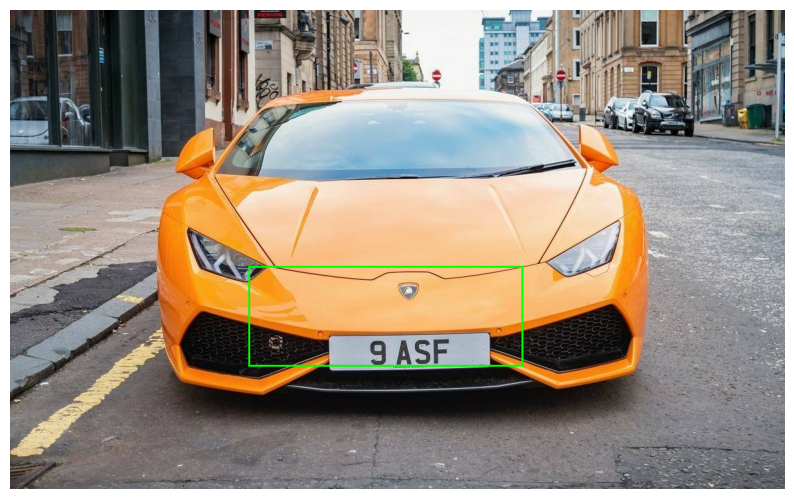

Original dimensions: height=1440, width=1080
Original box: (81.41277, 128.17168, 136.64078, 148.16475)
Rescaled box for original: (457, 720, 576, 625)


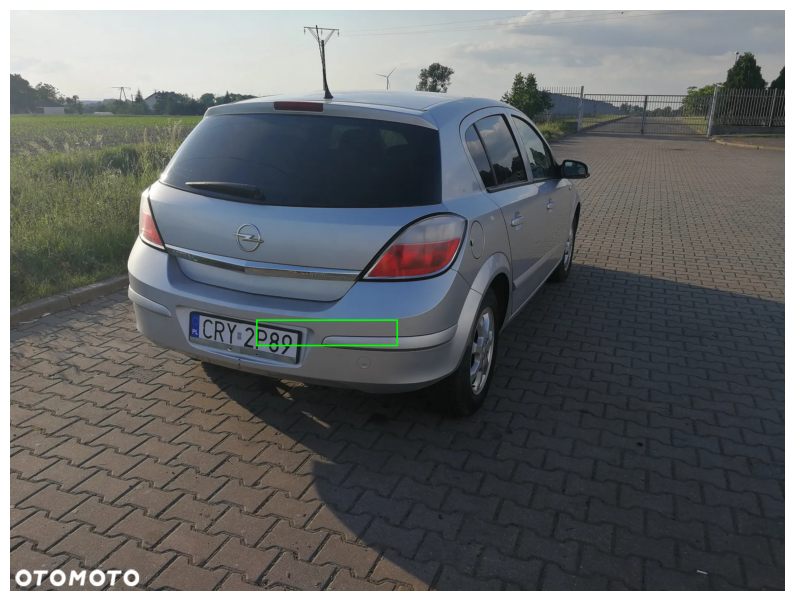

Original dimensions: height=976, width=549
Original box: (91.7915, 163.11908, 164.82603, 191.76085)
Rescaled box for original: (349, 621, 353, 411)


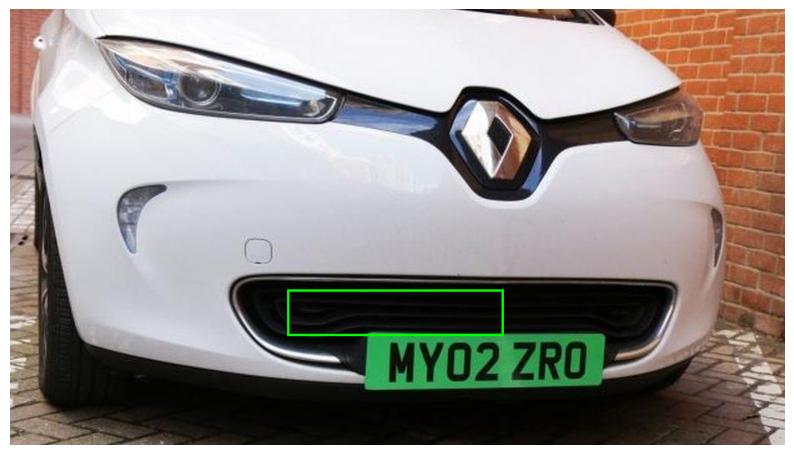

Original dimensions: height=976, width=450
Original box: (87.28417, 173.24089, 129.89587, 186.55939)
Rescaled box for original: (332, 660, 228, 327)


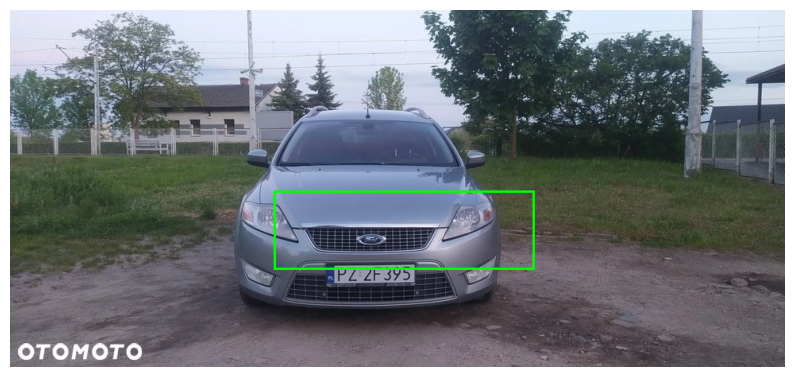

Original dimensions: height=337, width=449
Original box: (71.70179, 149.75381, 139.86365, 174.22102)
Rescaled box for original: (94, 197, 245, 305)


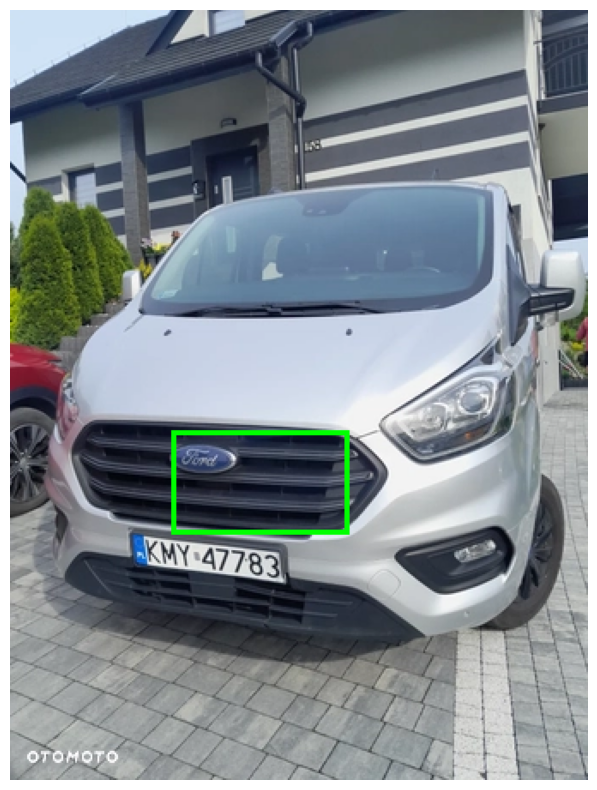

Original dimensions: height=1067, width=800
Original box: (104.91075, 175.86287, 159.71095, 198.41908)
Rescaled box for original: (437, 732, 499, 620)


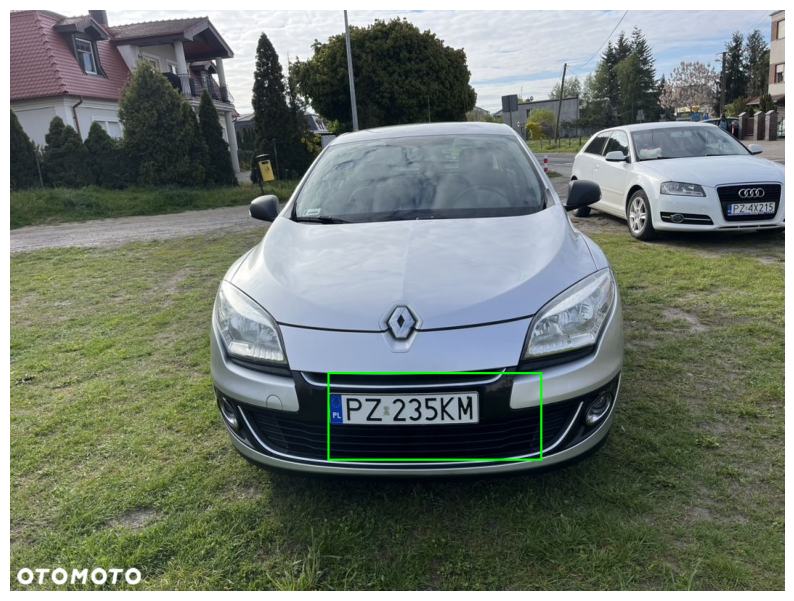

Original dimensions: height=1067, width=800
Original box: (98.186714, 147.00996, 135.41757, 168.24405)
Rescaled box for original: (409, 612, 423, 525)


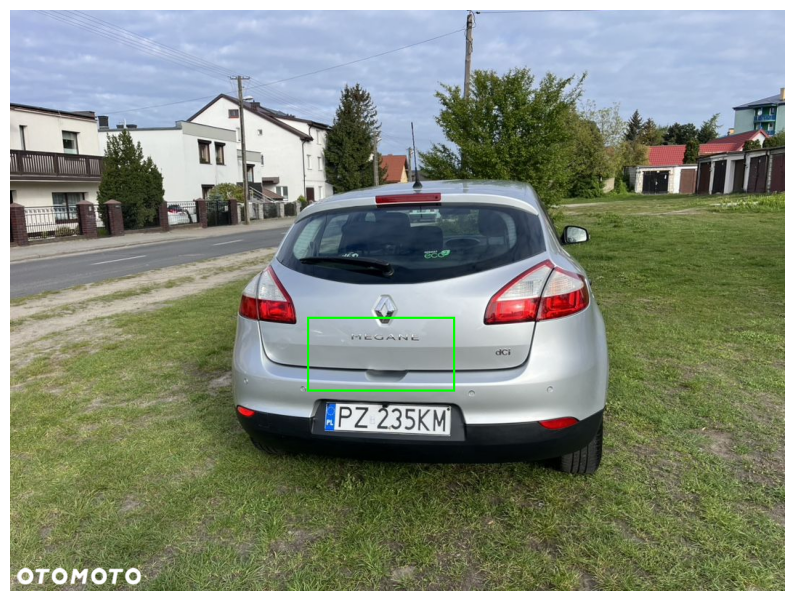

Original dimensions: height=1152, width=2048
Original box: (85.85035, 138.01053, 148.26167, 156.18956)
Rescaled box for original: (386, 621, 1186, 1249)


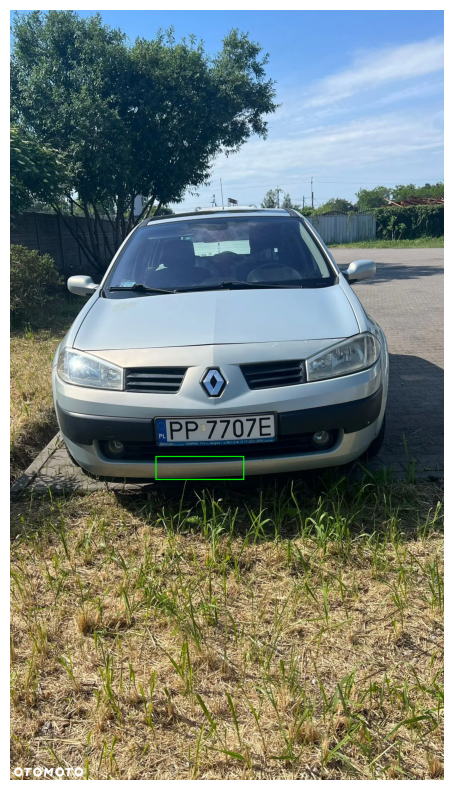

Original dimensions: height=1360, width=2031
Original box: (77.3316, 175.34235, 155.70737, 196.5691)
Rescaled box for original: (410, 931, 1235, 1559)


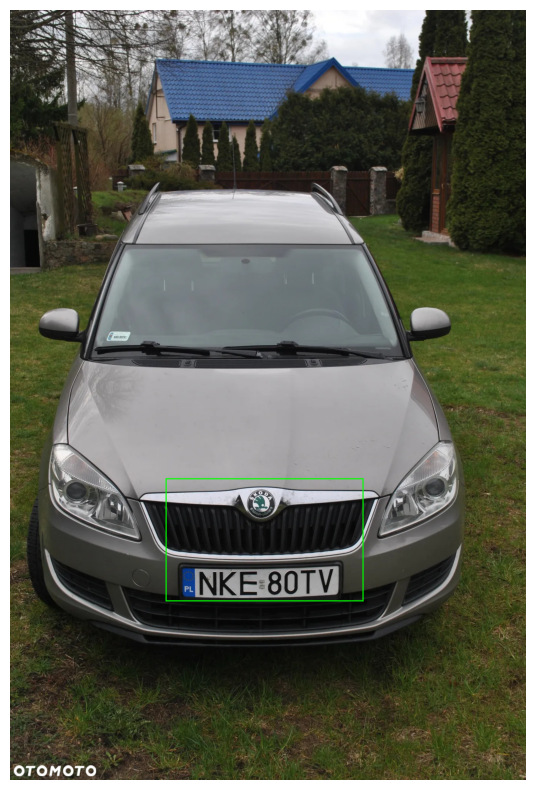

Original dimensions: height=1067, width=800
Original box: (93.67986, 178.79927, 157.29102, 197.44812)
Rescaled box for original: (390, 745, 491, 617)


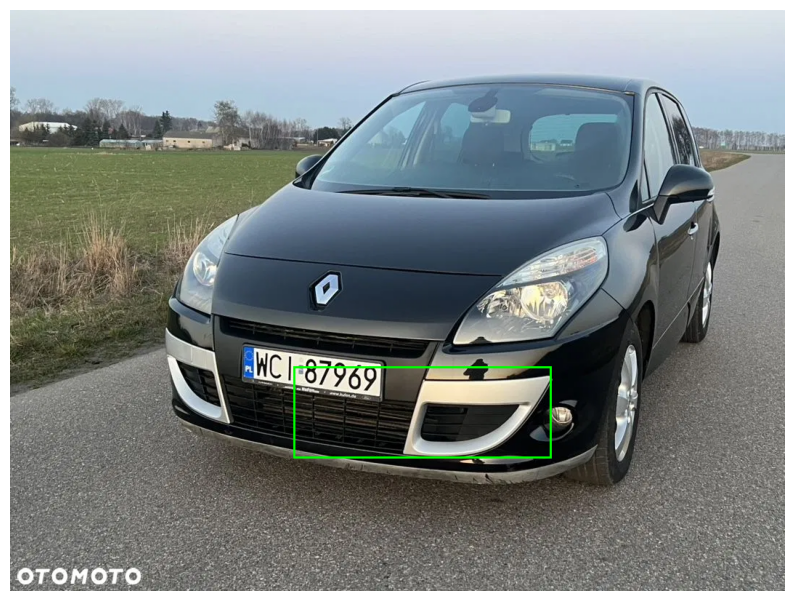

Original dimensions: height=2560, width=1920
Original box: (97.94831, 139.02742, 130.14665, 157.62355)
Rescaled box for original: (979, 1390, 976, 1182)


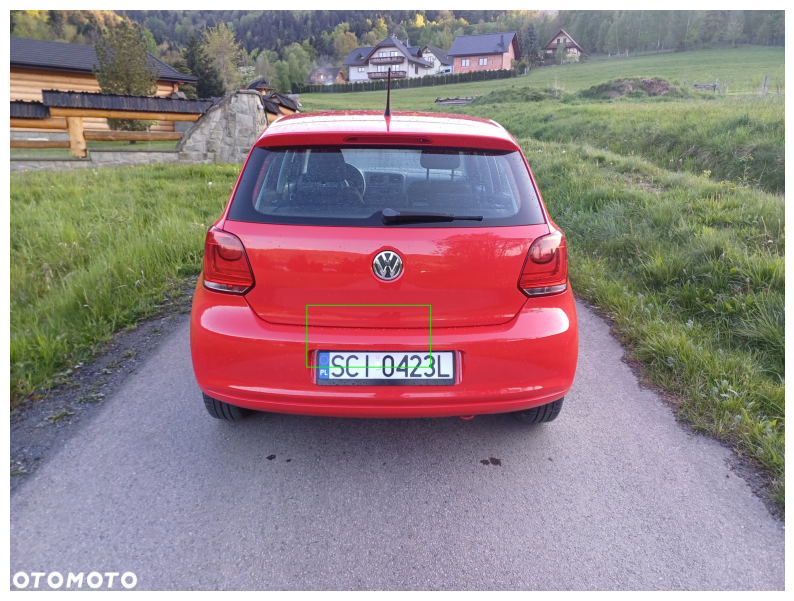

Original dimensions: height=1440, width=648
Original box: (105.72905, 182.173, 151.5444, 203.01974)
Rescaled box for original: (594, 1024, 383, 513)


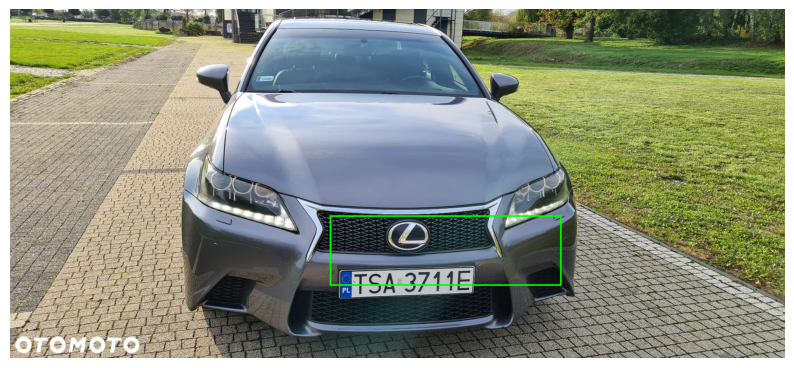

Original dimensions: height=1440, width=648
Original box: (122.880066, 131.32799, 133.43813, 138.59958)
Rescaled box for original: (691, 738, 337, 350)


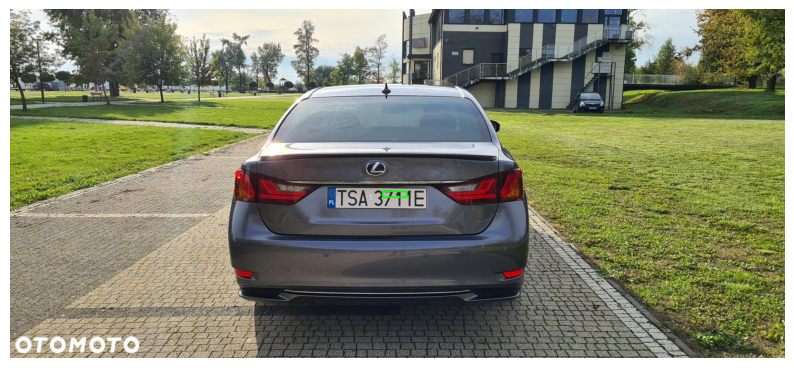

Original dimensions: height=1360, width=1813
Original box: (114.978355, 140.00955, 168.25441, 175.71257)
Rescaled box for original: (610, 743, 1191, 1244)


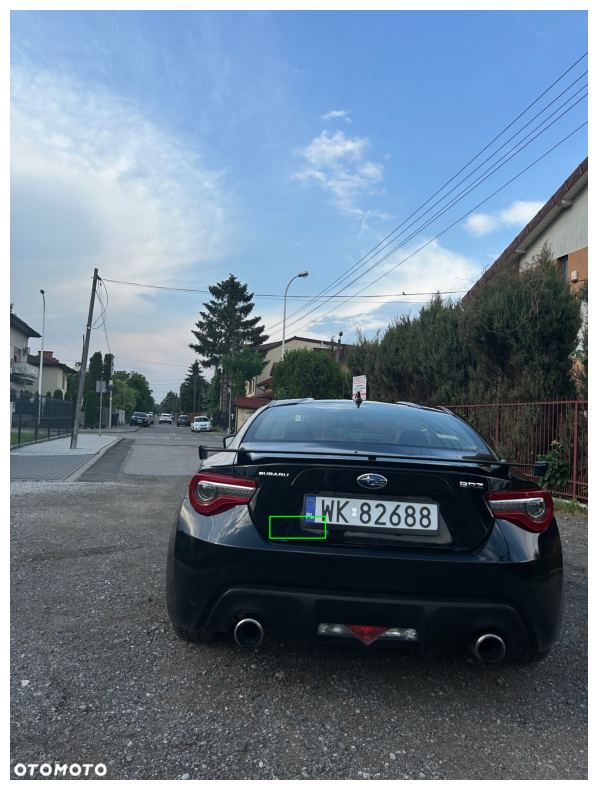

Original dimensions: height=1440, width=962
Original box: (110.939026, 187.34827, 171.32524, 213.14781)
Rescaled box for original: (624, 1053, 643, 800)


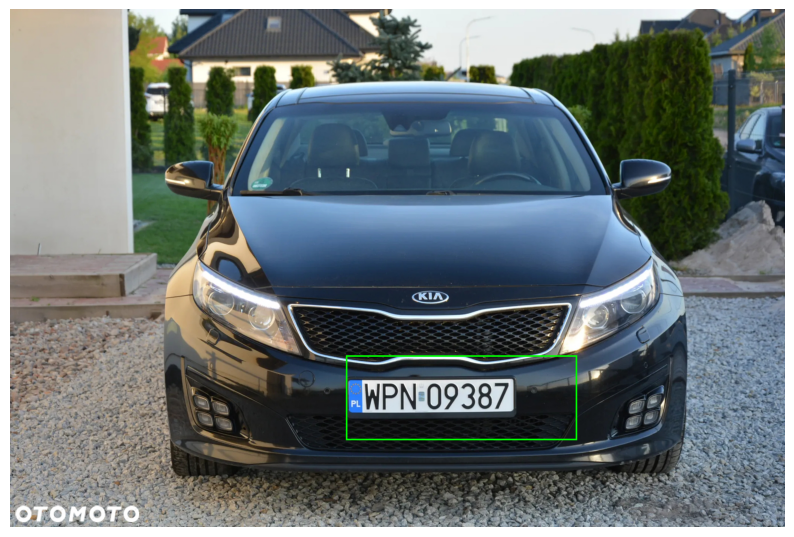

Original dimensions: height=1440, width=962
Original box: (65.66745, 140.91736, 121.4302, 170.9405)
Rescaled box for original: (369, 792, 456, 642)


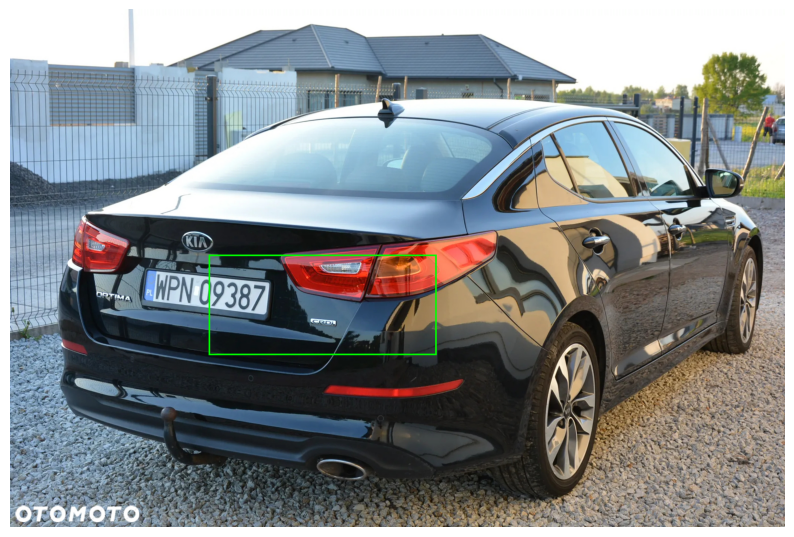

In [11]:
for i in range(len(check_images)):
    draw_image(i)

In [13]:
model.save('/Users/kuba/ML_project/project/object_detection_saved_model.h5')

Mozliwość wczytania gotowego modelu. 

In [ ]:
from tensorflow.keras.models import load_model

# Wczytaj model
model_path = '/Users/kuba/ML_project/saved_models/object_detection_model_v1.h5'
model = load_model(model_path, custom_objects={'iou_metric': iou_metric})